# Сборный проект - 4

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.


**Описание проекта**

Вы работаете в фотохостинге для профессиональных фотографов «Со Смыслом» (“With Sense”).

Ваши пользователи размещают свои фотографии на хостинге и сопровождают их полным описанием: указывают место съёмок, модель камеры и т. д. Отличительная особенность сервиса — описание: его может предоставить не только тот, кто размещает фотографию, но и другие пользователи портала. Например, для этой фотографии:


<img src="https://pictures.s3.yandex.net/resources/54501196_a9ac9d66f2_1661350725.jpg">

описание выглядит так:

    A hiker poses for a picture in front of stunning mountains and clouds.

Ваш отдел занимается экспериментом по разработке поиска референсных фотографий для фотографов. Суть поиска заключается в следующем: пользователь сервиса вводит описание нужной сцены. Например, такое:

    A man is crossing a mountain pass on a metal bridge.

Сервис выводит несколько фотографий с такой же или похожей сценой.

<img src="https://pictures.s3.yandex.net/resources/551403320_dfdcf9fc3b_1661350763.jpg">

Чтобы эксперимент получил право на жизнь, нужно защитить его перед руководителем компании. Для защиты необходимо презентовать так называемый PoC (Proof of Concept, Проверка концепции) — продемонстрировать, что такой проект практически осуществим. Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно выбрать лучшую  модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — и покажет, насколько текст и картинка подходят друг другу.

На основе лучшей модели можно будет собрать предварительную версию продукта, которую вы покажете руководителю компании.

**Юридические ограничения**

В некоторых странах, где работает компания With Sense, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, текстов, изображений, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

    This image is unavailable in your country in compliance with local laws.

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому необходимо очистить данные от проблемного контента. Во время тестирования модели при появлении в запросе “вредного” контента должен отображаться дисклеймер.


**План работы**

1.  Импорт необходимых библиотек и загрузка датасетов.
2.  Исследовательский анализ данных.

        - Агрегация оценки экспертов.
        - Агрегация оценки экспертов и польователей.

3.  Проверка данных.

        - Выявление нежелательного контента и удаление записей.

4.  Векторизация изображений.

        - Векторизация изображений с использованием модели ResNet50 из библиотеки PyTorch.

5.  Векторизация текста.

        - Векторизация текстового описания при помощи предобученной модели `bert-base-uncased`.


6.  Объединение векторов
7.  Обучение модели предсказания соответствия.

        - Выбор метрики, по которой будет сравниваться точность различных моделей.

        - Создание модели, которая покажет близость двух векторов. Модель должна принимать на вход конкатенированный вектор, состоящий из векторов описания и изображений, и предсказывать итоговую оценку экспертов.

        - Обучени моделей.
        
            1. Линейная регрессия;
            2. Ridge регрессия;
            3. Полносвязная нейронная сеть.

8.  Тестирование модели и демонстрация ее работы.

        - Создание функции, которая принимает на вход текстовое описание, делает его векторизацию и возвращает картинку с максимальным значением метрики.
        
        - С помощью функции тестирование работы модели на нескольких текстовых описаниях: проверьте, какие картинки она выдает при различных текстовых запросах.

9.  Вывод.

## Импорт необходимых библиотек и загрузка датасетов.

**Инсталляция модулей, отсутствующих в colab**

In [1]:
# %pip install -q transformers sentence-transformers

**Импорт библиотек.**

In [2]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
os.environ["TOKENIZERS_PARALLELISM"] = "false"
import requests
import zipfile

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import spacy
import re
import copy

from tqdm import notebook, tqdm
from PIL import Image

import torch
import torch.nn as nn
from math import ceil

import transformers
from transformers import BertModel, BertTokenizer

from sentence_transformers import SentenceTransformer, util

import torchvision.models as models
from torchvision import transforms

from sklearn.preprocessing import MinMaxScaler, Normalizer
from sklearn.model_selection import GroupShuffleSplit, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import mean_squared_error

RANDOM = 42
torch.manual_seed(RANDOM)
np.random.seed(RANDOM)

import warnings

warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
pd.set_option('max_colwidth', 300)

In [3]:
URL = 'https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip'
ZIP_FILE = 'dsplus_integrated_project_4.zip'
WORK_DIR = os.path.abspath(os.curdir)
print("Текущая деректория:", WORK_DIR)

Текущая деректория: /home/andreivk/Projects/Jupyter/Final


In [4]:
if not os.path.exists(os.path.join(WORK_DIR, ZIP_FILE)):
    myfile = requests.get(URL, allow_redirects=True)
    open(os.path.join(WORK_DIR, ZIP_FILE), 'wb').write(myfile.content)
    print(f'Файл {ZIP_FILE} загружен в директорию {WORK_DIR}')
else:  # если файл есть - то просто сообщаем об этом
    print(f'Файл {ZIP_FILE} существует в директории {WORK_DIR}')

Файл dsplus_integrated_project_4.zip существует в директории /home/andreivk/Projects/Jupyter/Final


In [5]:
try:
    with zipfile.ZipFile(os.path.join(WORK_DIR, ZIP_FILE), mode="r") as archive:
        archive.extractall(WORK_DIR)
        archive.close()
except zipfile.BadZipFile as error:
    print(error)

In [6]:
PATH = os.path.join(WORK_DIR, 'to_upload')
PATH_TRAIN = os.path.join(PATH, 'train_images')
PATH_TEST = os.path.join(PATH, 'test_images')

print(
    f"Путь к датасетам: {PATH}\nПуть к тренировочным изображениям: {PATH_TRAIN}\nПуть к тестовым изображениям:{PATH_TEST}"
)

Путь к датасетам: /home/andreivk/Projects/Jupyter/Final/to_upload
Путь к тренировочным изображениям: /home/andreivk/Projects/Jupyter/Final/to_upload/train_images
Путь к тестовым изображениям:/home/andreivk/Projects/Jupyter/Final/to_upload/test_images


**Загрузка датасетов.**

In [7]:
data_train = pd.read_csv(os.path.join(PATH, 'train_dataset.csv'))

data_crowd = pd.read_csv(
    os.path.join(PATH, 'CrowdAnnotations.tsv'),
    sep='\t',
    names=['image', 'query_id', 'share_positive', 'total_positive', 'total_negative'])

data_expert = pd.read_csv(
    os.path.join(PATH, 'ExpertAnnotations.tsv'),
    sep='\t',
    names=['image', 'query_id', 'expert_1', 'expert_2', 'expert_3'])

data_queries = pd.read_csv(os.path.join(PATH, 'test_queries.csv'),
                           index_col=[0],
                           sep='|')

data_images = pd.read_csv(os.path.join(PATH, 'test_images.csv'))

**Проверка загрузки датасетов.**

In [8]:
display("Тренировочный датасет:", data_train.head(),
        "Соответствие по краудсорсингу:", data_crowd.head(),
        "Соответствие по экспертным оценкам:", data_expert.head(),
        "Информация, необходимая для тестирования:", data_queries.head(),
        "Изображения для тестирования модели:", data_images.head())

'Тренировочный датасет:'

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .


'Соответствие по краудсорсингу:'

,image,query_id,share_positive,total_positive,total_negative
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


'Соответствие по экспертным оценкам:'

,image,query_id,expert_1,expert_2,expert_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


'Информация, необходимая для тестирования:'

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at each other .,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each other .,1177994172_10d143cb8d.jpg


'Изображения для тестирования модели:'

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


Датасеты загружены верно. Название столбцов у датасетов для дальнейшего объединения идентичны.

## Исследовательский анализ данных

### Датасет `data_train`

In [9]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


В этом датасете собрана информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`. Всего 5822 записи. Пропусков нету.

### Датасет `data_expert`

In [10]:
data_expert.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   expert_1  5822 non-null   int64 
 3   expert_2  5822 non-null   int64 
 4   expert_3  5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


В этом датасете  содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

Необходимо агрегировать экспертную оценку.

Это можно сделать следующим образом:

- Если две из трех оценок одинаковые, то можно взять мнение большинства. Это медиана из трех оценок.
- Если все оценки разные, можно взять среднее значение оценки.

**Агрегация оценки эксперта в новый столбец `score`.**

In [11]:
tqdm.pandas(desc="Финальная экспертная оценка")
data_expert['score'] = data_expert.progress_apply(
    lambda x: np.mean(x['expert_1':'expert_3'])
    if (x['expert_1'] != x['expert_2']) & (x['expert_1'] != x['expert_3']) & (x['expert_2'] != x['expert_3']) else
        np.median(x['expert_1':'expert_3']),
    axis=1)

Финальная экспертная оценка: 100%|██████████| 5822/5822 [00:02<00:00, 2626.58it/s]


**Масштабирование финальной оценки в диапазон от 0 до 1 и округление до 2-х знаков после запятой.**

In [12]:
data_expert['score'] = MinMaxScaler().fit_transform(np.array(data_expert['score']).reshape(-1,1))

In [13]:
data_expert['score'] = round(data_expert['score'], 2)

**Результат.**

In [14]:
data_expert.sample(5)

,image,query_id,expert_1,expert_2,expert_3,score
544,172097782_f0844ec317.jpg,3641022607_e7a5455d6c.jpg#2,3,4,4,1.00
1894,2621415349_ef1a7e73be.jpg,2675685200_0913d84d9b.jpg#2,1,1,2,0.00
5546,539751252_2bd88c456b.jpg,3564543247_05cdbc31cf.jpg#2,2,3,3,0.67
4923,3694093650_547259731e.jpg,2204550058_2707d92338.jpg#2,1,1,1,0.00
3624,3263395801_5e4cee2b9e.jpg,1554713437_61b64527dd.jpg#2,1,2,2,0.33


Оценки агрегированы верно.

**Объединение датасетов `data_train` и `data_expert`.**

In [15]:
data_train = pd.merge(data_train, data_expert[[
                      'image', 'query_id', 'score']], how='outer', on=['image', 'query_id'])

In [16]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   score       5822 non-null   float64
dtypes: float64(1), object(3)
memory usage: 227.4+ KB


**Пример на одном из изображений.**

In [17]:
display(data_train[data_train['image'] == '1056338697_4f7d7ce270.jpg'])

,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.00
12,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses smiles .,0.00
22,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.00
27,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empty square .,0.33
31,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,0.00
38,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,A soccer ball is above the head of a man wearing black shorts and red and black striped shirt .,0.00
44,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,A young boy dressed in a red uniform kicks the soccer ball on the field as another child in blue watches from behind .,0.00
59,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,A man and woman look back at the camera while standing in front of a red art structure .,0.00


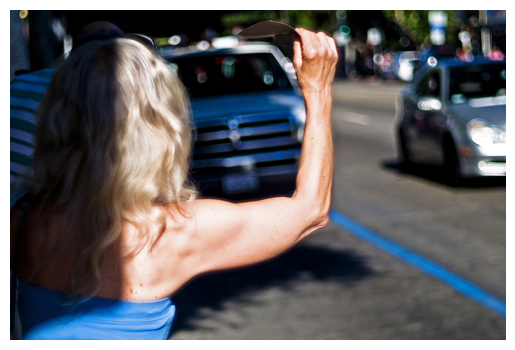

In [18]:
image = Image.open(os.path.join(PATH_TRAIN, '1056338697_4f7d7ce270.jpg'))
plt.imshow(image)
plt.axis('off')
plt.show()

Как видно выше на изображени женщина видимо голосующая на дороге.

В описаниях в фото практически нету соответсвий. И оценки соответсвующие.

### Датасет `data_crowd`

In [19]:
data_crowd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           47830 non-null  object 
 1   query_id        47830 non-null  object 
 2   share_positive  47830 non-null  float64
 3   total_positive  47830 non-null  int64  
 4   total_negative  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


В датасете с краудсорсинговыми оценками информация расположена в таком порядке:

- Доля исполнителей, подтвердивших, что текст соответствует картинке.
- Количество исполнителей, подтвердивших, что текст соответствует картинке.
- Количество исполнителей, подтвердивших, что текст не соответствует картинке.

Необходимо объединить датасеты `data_crowd` и `data` и создать агрегированню оценку экспртов и пользователей.

Т.к в результате слияния датасетов возникнет ситуация, при которой будет следующее:

- экспертная оценка есть, а пользовательской оценки нету;
- пользовательская есть, а экспертной нету;
- есть обе оценки.

Агрегированнную оценку можно вычислить следующим образом:

- если экспертная оценка есть, а пользовательской оценки нету - берем экспертную;
- если пользовательская есть, а экспертной нету - берем пользовательскую;
- если есть обе, то агрегированную считаем по формуле: экспертная * 0.8 + пользовательская * 0.2 (отдаем предпочтение экспертам).

**Огругление до 2-х знаков.**

In [20]:
data_crowd['share_positive'] = round(data_crowd['share_positive'], 2)

**Объединение датасетов.**

In [21]:
data = pd.merge(data_train,
                data_crowd[['image', 'query_id', 'share_positive']],
                how='outer',
                on=['image', 'query_id'])

**Результат.**

In [22]:
data.sample(5)

,image,query_id,query_text,score,share_positive
45057,3725202807_12fbfdd207.jpg,2224450291_4c133fabe8.jpg#2,NaN,NaN,0.0
12347,2170222061_e8bce4a32d.jpg,2932740428_b15384f389.jpg#2,NaN,NaN,0.0
14369,2295216243_0712928988.jpg,909191414_1cf5d85821.jpg#2,NaN,NaN,0.0
3840,2884301336_dc8e974431.jpg,2396025708_e4a72e2558.jpg#2,A man windsurfs in the ocean .,0.0,NaN
42542,3596131692_91b8a05606.jpg,1523984678_edd68464da.jpg#2,NaN,NaN,0.0


**Функция для агрегации оценки.**

In [23]:
def final_score(row):
    '''

    Функция для агрегации оценки людей и экспертов

    Параметр:

     row: датасет.

    Вовращаемое значение:

     row: датасет с добавленным столбцом целевого признака target_score.

    '''

    if np.isnan(row['score']):
        row['target_score'] = row['share_positive']
    elif np.isnan(row['share_positive']):
        row['target_score'] = row['score']
    elif (row['score'] == 1) & (row['share_positive'] != 1):
        row['target_score'] = row['score']
    else:
        row['target_score'] = row['score'] * 0.8 + row['share_positive'] * 0.2

    return row

**Агрегация оценки.**

In [24]:
tqdm.pandas(desc="Агрегированная оценка")
data = data.progress_apply(final_score, axis=1)
data['target_score'] = round(data['target_score'], 4)

Агрегированная оценка: 100%|██████████| 51323/51323 [00:36<00:00, 1396.98it/s]


**Результат.**

In [25]:
display(data[data['image'] == '1056338697_4f7d7ce270.jpg'].head(10))

,image,query_id,query_text,score,share_positive,target_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .,0.00,0.0,0.00
12,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses smiles .,0.00,0.0,0.00
22,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.00,NaN,0.00
27,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empty square .,0.33,NaN,0.33
31,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,0.00,NaN,0.00
38,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,A soccer ball is above the head of a man wearing black shorts and red and black striped shirt .,0.00,NaN,0.00
44,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,A young boy dressed in a red uniform kicks the soccer ball on the field as another child in blue watches from behind .,0.00,NaN,0.00
59,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,A man and woman look back at the camera while standing in front of a red art structure .,0.00,0.0,0.00
5822,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,NaN,NaN,1.0,1.00
5823,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,NaN,NaN,0.0,0.00


В результате слияния датасета образовались пустые значения в описаниях.

Т.к. у одного фото может быть несколько описаний, имеющий свой `query_id`, соответсвенно `query_id` может соттветсвовать нескольким фото, при этом `query_id` уникальный, то можно заполнить пропуски через группировку по `query_id` методом  `ffill`. Пропуски могут заполниться не все. Оставшиеся строки с пустыми описаниями можно удалить.

**Заполнение пропусков.**

In [26]:
tqdm.pandas(desc="Заполнение пропусков в столбце query_text")
data['query_text'] = data.groupby('query_id')['query_text'].progress_apply(lambda x: x.fillna(method="ffill"))

Заполнение пропусков в столбце query_text: 100%|██████████| 1000/1000 [00:00<00:00, 3098.84it/s]


**Удаление пропусков.**

In [27]:
data.drop(['score', 'share_positive'], axis=1 , inplace= True )

data.dropna(inplace=True)

In [28]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50214 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   image         50214 non-null  object 
 1   query_id      50214 non-null  object 
 2   query_text    50214 non-null  object 
 3   target_score  50214 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.9+ MB


**Проверка соответствия оценки и описания**

Для проверки возьмем несколько фото и выведем на экран.

**Функция вывода фото на экран.**

In [29]:
def show_pictures(dataset, path, title_column=None, figsize=(12,12)):

    '''

    Функция вывода фото на экран

    Параметр:

     dataset: датасет.
     path: путь к файлам с картинками.
     title_column: заголовок к фото.
     figsize: размер изображения.

    '''


    fig = plt.figure(figsize=figsize)
    for i in range(4):
        image = Image.open(os.path.join(path, dataset['image'][i]))
        fig.add_subplot(2, 2, i+1)
        plt.imshow(image)

        plt.title(dataset[title_column][i])

        plt.axis('off')
        plt.tight_layout()

4 фото с маскимальной оценкой `1`.

In [30]:
top_score = data[data['target_score'] == 1][[
    'image', 'query_text', 'target_score'
]].sample(4).reset_index(drop=True)

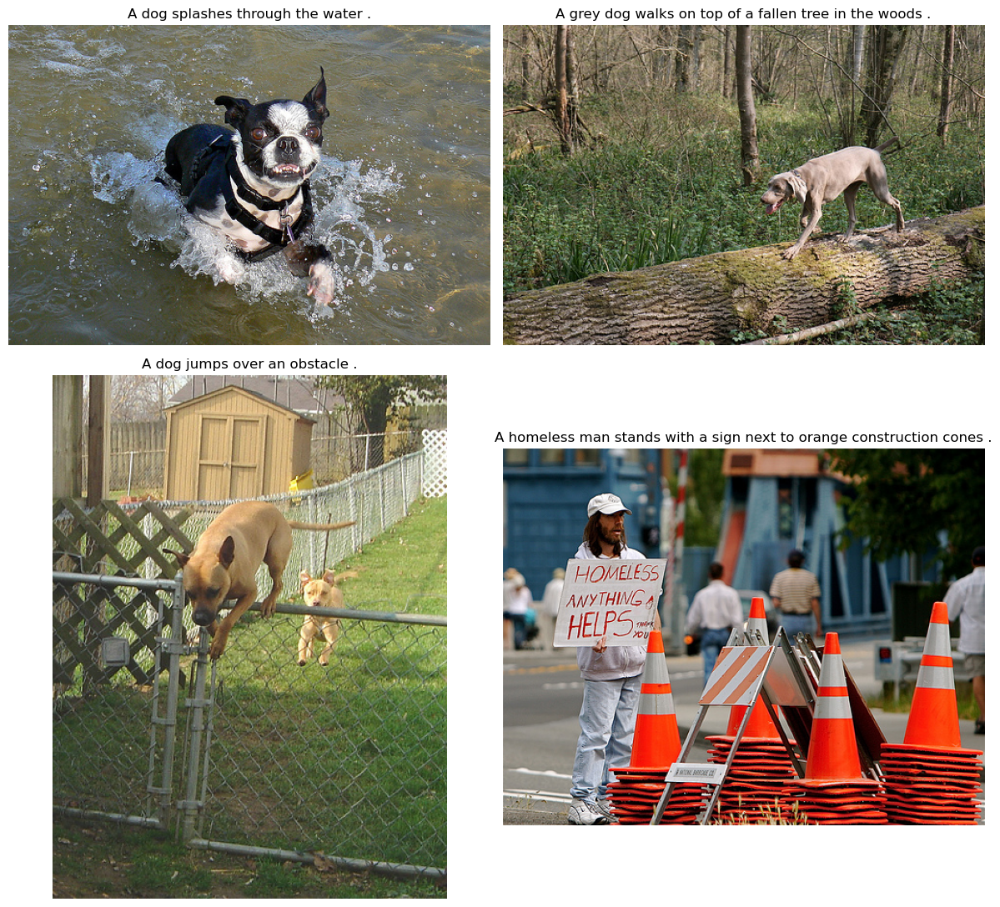

In [31]:
show_pictures(top_score, PATH_TRAIN, title_column='query_text')

4 фото с минимальной оценкой `0`.

In [32]:
bottom_score = data[data['target_score'] == 0][[
    'image', 'query_text', 'target_score'
]].sample(4).reset_index(drop=True)

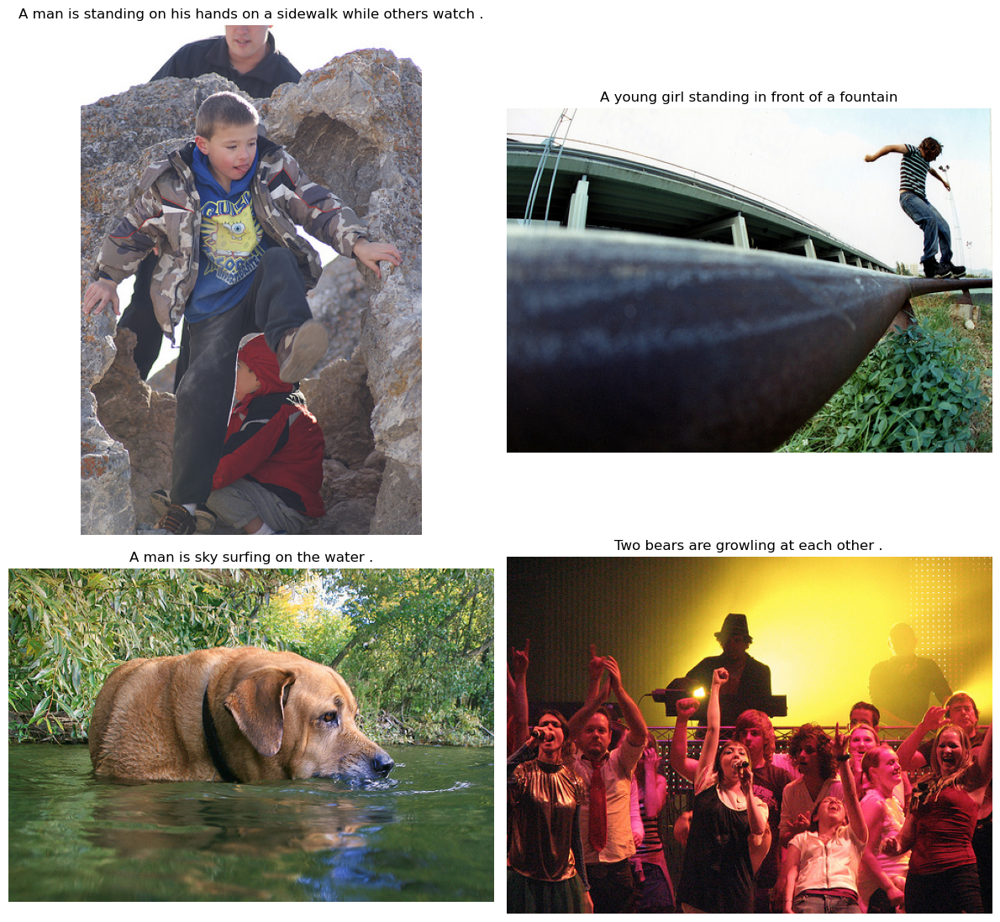

In [33]:
show_pictures(bottom_score, PATH_TRAIN, title_column='query_text')

По оценке `1` - фото размечены правильно, оценка соответсвует.

По оценке `0` - фото размечены практически правильно, оценка практически соответсвует.

### Датасет `data_queries`

In [34]:
data_queries.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


В датасете находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`. Всего 500 записей.

### Датасет `data_images`

In [35]:
data_images.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes


В датасете содержатся имена 100 уникальных изображений для тестирования модели.

Данные подготовлены для проверки на запрещенные описания.

## Проверка данных

Необходимо убрать из тренировочного датасета все описания, которые не подходят нам на юридической основе, а конкретно содержащие описание детей. Ребёнком считается любой человек, не достигший 16-ти лет.

**Список стоп-слов, связанных с детьми.**

In [36]:
stop_list = ['child', 'baby', 'boy', 'girl', 'teenager', 'schoolboy', 'youth', 'newborn', "kid", "babe",
             "infant", "teenager", "teen", "juvenile"]

**Загрузка языковой модели `en_core_web_sm`.**

In [37]:
nlp = spacy.load("en_core_web_sm")

**Загрузка стоп-слов spacy**

In [38]:
stopwords = list(spacy.lang.en.stop_words.STOP_WORDS)

**Функция для очистки текста.**

In [39]:
def clean_text(text):
    '''
    Функция для очистки текста.

    Параметр:

     text: исходный текст для очистки.

    Вовращаемое значение:

     phrase: очищенный текст.

    '''

    # преобразование сокращений
    phrase = re.sub(r"’", "'", text)
    phrase = re.sub(r"\n", " ", phrase)
    phrase = re.sub(r"\t", " ", phrase)
    phrase = re.sub(r"\\", "", phrase)
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can't", "can not", phrase)
    phrase = re.sub(r"n't", " not", phrase)
    phrase = re.sub(r"'re", " are", phrase)
    phrase = re.sub(r"'s", " is", phrase)
    phrase = re.sub(r"'d", " would", phrase)
    phrase = re.sub(r"'ll", " will", phrase)
    phrase = re.sub(r"'ve", " have", phrase)
    phrase = re.sub(r"'m", " am", phrase)
    phrase = re.sub(r"ar", "are", phrase)

    # оставляем только символы и пунктуацию
    phrase = re.sub(r'[^a-zA-Z]', ' ', phrase)
    # заменяем несколько пробелов на 1 пробел
    phrase = re.sub(r'([ ])\1+', ' ', phrase)
    phrase = phrase.lower()

    return phrase.strip()

**Очистка текста от знаков препинания**

In [40]:
tqdm.pandas(desc="Удаление знаков препинания и приведение текста в нижний регистр")
data['query_text'] = data['query_text'].progress_apply(clean_text)

Удаление знаков препинания и приведение текста в нижний регистр: 100%|██████████| 50214/50214 [00:00<00:00, 57712.50it/s]


**Функция для токкенизации, лемматизации, удаления стоп-слов.**

In [41]:
def clear_text_lemm(text):
    '''
    Функция для токкенизации, лемматизации, удаления стоп-слов.

    Параметр:

     text: очищенный текст.

    Вовращаемое значение:

     mytokens: леммы без стоп-слов и пунктуации в нижнем регистре.

    '''

    # создание токкенов
    mytokens = nlp(text)

    # лемматизачия токкена и перевод в нижний регистр
    mytokens = [
        word.lemma_.strip() if word.lemma_ != "-PRON-" else word
        for word in mytokens
    ]

    # удаление стоп-слов, знаков пунктуации и возможных оставшихся цифр
    mytokens = " ".join([word for word in mytokens if word not in stopwords])

    return mytokens

**Функция для добавления флага по запрещенному контенту.**

In [42]:
def block_images(row):
    '''
    Функция для добавления флага по запрещенному контенту.

    Параметр:

     row: датасет.

    Вовращаемое значение:

     row: датасет с добавленным столбцом с флагом.

    '''

    if [i for i in clear_text_lemm(row['query_text']).split() if i in stop_list]:
        row['stop'] = True
    else:
        row['stop'] = False
    return row

**Выявление нежелательного контента.**

In [43]:
tqdm.pandas(desc="Выявление в тексте запретных слов")
data = data.progress_apply(block_images, axis=1)

Выявление в тексте запретных слов: 100%|██████████| 50214/50214 [06:17<00:00, 132.95it/s]


**Результат.**

In [44]:
data.sample(5)

,image,query_id,query_text,target_score,stop
20639,2631300484_be8621d17b.jpg,3080056515_3013830309.jpg#2,the boy is whispering in the girls eare,0.0,True
1267,3106026005_473a7b1c8c.jpg,2248487950_c62d0c81a9.jpg#2,a woman crosses the street neare a man who is on his cellphone,0.0,False
17815,2484190118_e89363c465.jpg,3685328542_ab999b83bb.jpg#2,a man in a green and silver maredi gras costume in a pareade,0.0,False
35711,3354330935_de75be9d2f.jpg,1174525839_7c1e6cfa86.jpg#2,a young long haired girl on the beach is jumping in the air,0.0,True
20083,2600867924_cd502fc911.jpg,293879742_5fe0ffd894.jpg#2,a dog jumping off a fence and another dog on the grass in the background,0.0,False


Контет размчечен правильно.

Выделение запретного контента в отдельный датасет

In [45]:
samples_stop = data[data['stop'] == True][['image', 'query_id', 'query_text']]

In [46]:
samples_stop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14166 entries, 0 to 51318
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       14166 non-null  object
 1   query_id    14166 non-null  object
 2   query_text  14166 non-null  object
dtypes: object(3)
memory usage: 442.7+ KB


Удаление последних 2-х символов в `query_id`.

In [47]:
tqdm.pandas(desc="Удаление 2-х последних символов в query_id")
samples_stop['query_id'] = samples_stop['query_id'].progress_apply(lambda x: x.replace('#2', ''))

Удаление 2-х последних символов в query_id: 100%|██████████| 14166/14166 [00:00<00:00, 896839.45it/s]


Выделение списка запретных файлов в множество, чтобы удалить дубликаты.

In [48]:
samples_stop_set = set(samples_stop['query_id'])

Количество файлов.

In [49]:
len(samples_stop_set)

287

Удаление из датасета пар "изображение/описание" с плохими изображениями.

In [50]:
data = data[~data['image'].isin(samples_stop_set)].reset_index(drop=True)

In [51]:
del samples_stop

**Вывод на экран изображений с запрещенным описанием**

In [52]:
samples = data[data['stop'] == True][['image', 'query_text']].sample(4).reset_index(drop=True)

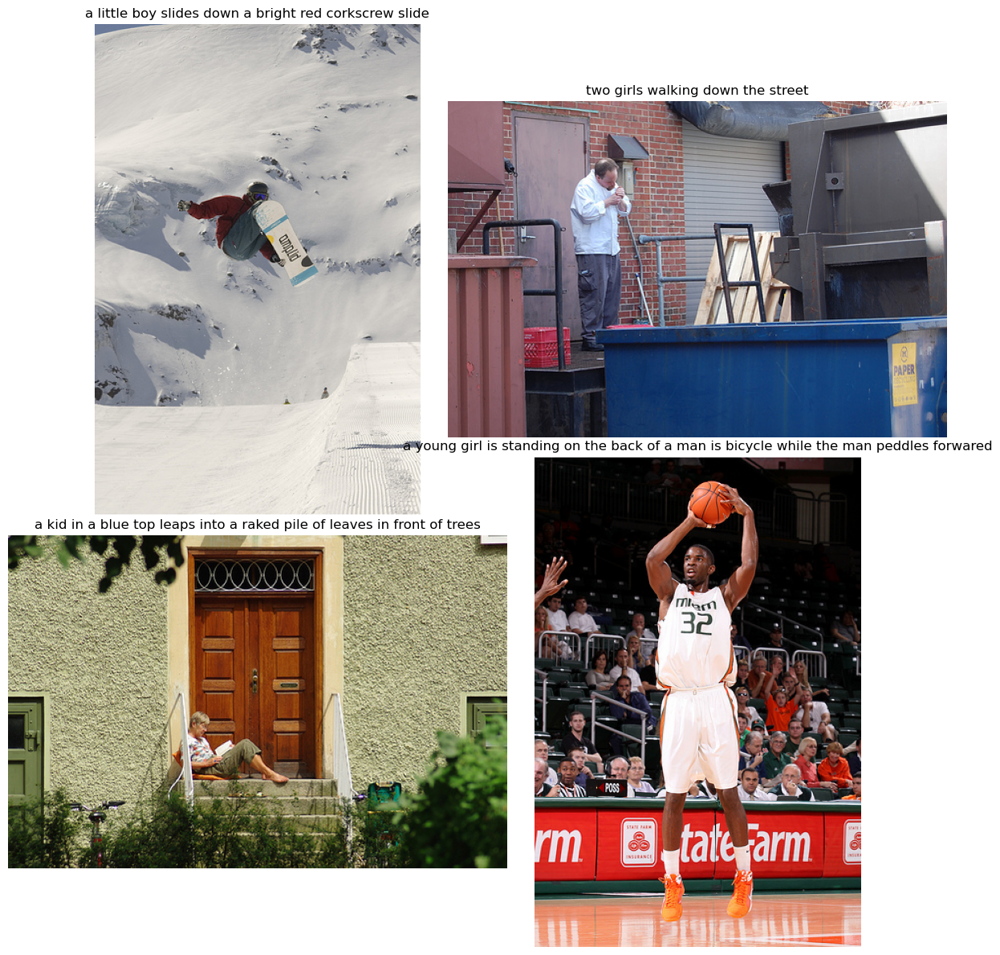

In [53]:
show_pictures(samples, PATH_TRAIN, title_column='query_text')

В некоторых описаниях и фотографиях где есть запрет есть соттветствие, в некоторых нету соответсвия, это нормально, т.к. не все описания соответствуют фото и имеют нулевую оценку.

**Удаление записей с запретным описанием.**

In [54]:
data.drop('stop', axis= 1 , inplace= True)
data.reset_index(inplace=True, drop=True)

**Финальный датасет**

In [55]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36021 entries, 0 to 36020
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   image         36021 non-null  object 
 1   query_id      36021 non-null  object 
 2   query_text    36021 non-null  object 
 3   target_score  36021 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.1+ MB


Датасет подкотовлен к векторизации и обучению. Осталось 36048 записей.

## Векторизация изображений

**Проверка устройства для вычислений.**

In [56]:
device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
device

device(type='cuda', index=0)

Векторы изображений и описаний будут генерироваться на `GPU`.

**Загрузка модели ResNet18 и заморозка весов.**

In [57]:
resnet = models.resnet18(weights="IMAGENET1K_V1")

for param in resnet.parameters():
    param.requires_grad_(False)

modules = list(resnet.children())[:-1]
resnet = nn.Sequential(*modules).to(device)

resnet.eval()

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /home/andreivk/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:04<00:00, 9.40MB/s]


Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Con

**Форматирование изображения. Изменения размера картинки и нормализация.**

In [58]:
norm = transforms.Normalize(
    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    norm,
])

**Функция получения векторного представления изображений.**

In [59]:
def image_vector(path, dataset):

    '''
    Функция получения векторного представления текстовых описаний.

    Параметры:

     dataset: датасет с именами файлов изображений
     path: путь к картинкам


    Возвращаемое значение:

     data_npy - матрица с векторами изображений.

    '''

    data_list = []

    for i in notebook.tqdm(range(len(dataset))):

        img = Image.open(
            os.path.join(path, dataset['image'][i])).convert('RGB')
        image_tensor = preprocess(img).to(device)
        output_tensor = resnet(image_tensor.unsqueeze(0)).flatten()
        data_list.append(output_tensor.cpu().numpy())
        data_npy = np.array(data_list)

    return data_npy

In [60]:
def get_vectors(dataset=None, column=None, function=None):

    data_copy = dataset.copy(deep=True)
    var_unique = data_copy[column].unique()
    train_dataset_unique = pd.DataFrame(data=var_unique, columns=[column])

    if function.__name__ == 'text_vector':

        vectors = text_vector(train_dataset_unique[column], batch_size=32, device=device)

    else:

        vectors = image_vector(PATH_TRAIN, train_dataset_unique)

    train_dataset_unique['vector'] = vectors[:,].tolist()
    data_copy = data_copy.merge(train_dataset_unique, on=column, how='left')

    final_vectors = np.array(data_copy['vector'].tolist())

    del data_copy, train_dataset_unique

    return final_vectors

**Получение векторов изображений.**

In [61]:
image_vectors = get_vectors(dataset=data, column='image', function=image_vector)
print(f"Матрица векторов изображений: {image_vectors.shape}")

  0%|          | 0/713 [00:00<?, ?it/s]

Матрица векторов изображений: (36021, 512)


## Векторизация текста

Текстовые векоторы будут получены при помощи предобученной модели `bert-base-uncased`.

**Загрузка предобученной модели BertModel.**

In [62]:
model_class, tokenizer_class, pretrained_weights = (BertModel,
                                                    BertTokenizer,
                                                    'bert-base-uncased')

**Инициализируем токенизатор как объект класса `BertTokenizer()`.**

In [63]:
tokenizer = tokenizer_class.from_pretrained(pretrained_weights)

**Инициализируем модель как объект класса `BertModel()`.**

In [64]:
model = model_class.from_pretrained(pretrained_weights)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


**Функция получения векторного представления текстовых описаний.**

In [65]:
def text_vector(data, batch_size=32, device=device):

    '''
    Функция получения векторного представления текстовых описаний.

    Параметры:

     data: столбец с описаниями
     batch_size: размер батча, по умолчанию 32
     device: параметр, где будут вычисления: CPU или GPU


    Возвращаемое значение:

     vectors - матрица с векторами описания изображений.

    '''

    #Преобразование текста в номера токенов из словаря методом encode().

    tqdm.pandas(desc="Токкенизация Bert")
    tokenized = data.progress_apply(lambda x: tokenizer.encode(
        x, add_special_tokens=True, max_length=512, truncation=True))

    max_len = 0
    for i in tokenized.values:
        if len(i) > max_len:
            max_len = len(i)

     #     метод padding, чтобы после токенизации длины исходных текстов в корпусе
     #     были равными и поясним модели, что нули не несут значимой информации.
     #     Это нужно для компоненты модели, которая называется «внимание».
     #     Отбросим эти токены и «создадим маску» для действительно важных токенов,
     #     то есть укажем нулевые и не нулевые значения

    padded = np.array([i + [0]*(max_len - len(i)) for i in tokenized.values])

    attention_mask = np.where(padded != 0, 1, 0)

    batch_size = batch_size

    embeddings = []

    model.to(device)

    # Цикл по батчам.
    for i in notebook.tqdm(range(padded.shape[0] // batch_size + 1)):
        batch = torch.LongTensor(padded[batch_size * i:batch_size * (i + 1)])
        attention_mask_batch = torch.LongTensor(
            attention_mask[batch_size * i:batch_size * (i + 1)])

        with torch.no_grad():
            batch_embeddings = model(
                batch.to(device), attention_mask=attention_mask_batch.to(device))

        embeddings.append(batch_embeddings[0][:, 0, :].cpu().numpy())

    # Сбор эмбеддингов в матрицу признаков вызовом функции concatenate()
    vectors = np.concatenate(embeddings)

    return vectors

**Вызов функции и получение векторов описаний**.

In [66]:
word_vectors = get_vectors(dataset=data, column='query_text', function=text_vector)
print(f"Матрица векторов описаний: {word_vectors.shape}")

Токкенизация Bert: 100%|██████████| 977/977 [00:00<00:00, 2865.21it/s]


  0%|          | 0/31 [00:00<?, ?it/s]

Матрица векторов описаний: (36021, 768)


## Объединение векторов

**Объединенние векторов изображений и описаний при помощи `np.hstack`.**

In [67]:
features = np.hstack((image_vectors, word_vectors))
features.shape

(36021, 1280)

**Целевой признак.**

In [68]:
target = data['target_score']
target.shape

(36021,)

Векторы изображений и описаний объединены в матрицу 36048 на 2816.

## Обучение модели предсказания соответствия

### Разбиение на выборки

Для обучения разделим датасет на тренировочную и валидационную выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в валидационную выборки. Для того чтобы учесть изображения при разбиении, воспользуемся классом `GroupShuffleSplit` из библиотеки `sklearn.model_selection`.

In [69]:
gss = GroupShuffleSplit(n_splits=1, train_size=.8, random_state=RANDOM)
train_indices, valid_indices = next(gss.split(X=features, y=target, groups=data['image']))

In [70]:
features_train, features_valid = features[train_indices], features[valid_indices]

In [71]:
target_train, target_valid = target[train_indices], target[valid_indices]

In [72]:
print(features_train.shape, features_valid.shape, target_train.shape, target_valid.shape)

(28856, 1280) (7165, 1280) (28856,) (7165,)


**Масштабирование признаков.**

Признаки преобразовываются при помощи `Normalizer`.

In [73]:
scaler = Normalizer()
scaler.fit(features_train)

features_train = scaler.transform(features_train)
features_valid = scaler.transform(features_valid)

### Метрика

В качестве метрики для регресси можно выбрать `RMSE`, т.к `RMSE` чувствительнее к выбросам, чем `MAE`, и может быть более точным показателем производительности модели в случаях, когда наблюдаются большие различия между истинными значениями и предсказаниями

### Модели

В обучении будут использованы 3 модели:

- `LinearRegression`;
- `Ridge`;
- `Полносвязанная нейронная сеть`.

#### LinearRegression

**Инициализация модели.**

In [74]:
model_linreg = LinearRegression(fit_intercept=True, copy_X=False, positive=True, n_jobs=-1)

**Обучение модели.**

In [75]:
model_linreg.fit(features_train, target_train)

LinearRegression(copy_X=False, n_jobs=-1, positive=True)

**Результат.**

In [76]:
predicted_linreg_valid = model_linreg.predict(features_valid)

rmse_linreg_valid = round((mean_squared_error(target_valid, predicted_linreg_valid, squared=False)), 2)

print(f"RMSE на валидационной выборке --> {rmse_linreg_valid}")

RMSE на валидационной выборке --> 0.22


#### Ridge

**Инициализация модели.**

In [77]:
model_ridge = Ridge(alpha=1, copy_X=False, random_state=RANDOM)

**Сетка с параметрами модели.**

In [78]:
param_ridge = {
    'solver':['svd', 'cholesky', 'lsqr', 'sag'],
    'fit_intercept':[True, False]
}

**Обучение модели.**

In [79]:
model_ridge = GridSearchCV(model_ridge,
                           param_ridge,
                           scoring='neg_mean_absolute_error',
                           n_jobs=-1,
                           cv=[(slice(None), slice(None))])

In [80]:
model_ridge.fit(features_train, target_train)

GridSearchCV(cv=[(slice(None, None, None), slice(None, None, None))],
             estimator=Ridge(alpha=1, copy_X=False, random_state=42), n_jobs=-1,
             param_grid={'fit_intercept': [True, False],
                         'solver': ['svd', 'cholesky', 'lsqr', 'sag']},
             scoring='neg_mean_absolute_error')

**Результат.**

In [81]:
print(f"Лучшие гиперпараметры: {model_ridge.best_estimator_}")

predicted_ridge_valid = model_ridge.best_estimator_.predict(features_valid)

rmse_ridge_valid = round((mean_squared_error(target_valid, predicted_ridge_valid, squared=False)), 2)

print(f"RMSE на валидационной выборке --> {rmse_ridge_valid}")

Лучшие гиперпараметры: Ridge(alpha=1, copy_X=False, fit_intercept=False, random_state=42, solver='sag')
RMSE на валидационной выборке --> 0.27


#### Полносвязанная нейронная сеть

**Создание тензоров по каждой выборке.**

In [82]:
features_train_nn = torch.FloatTensor(features_train)
features_valid_nn = torch.FloatTensor(features_valid)
target_train_nn = torch.FloatTensor(np.array(target_train))
target_valid_nn = torch.FloatTensor(np.array(target_valid))

**Определение количества нейронов.**

In [83]:
# Входные нейроны
n_in_neurons = features_train_nn.shape[1]
# Нейроны 1-го скрытого слоя
n_hidden_neurons_1 = 512
# Нейроны 2-го скрытого слоя
n_hidden_neurons_2 = 128
# Нейрон на выходе
n_out_neurons = 1

**Список с количеством нейронов для создания модели.**

In [84]:
# список нейронов
n_neurons_lst = [
    n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_out_neurons]

**Функция для создания моделей.**

In [85]:
def create_model(neurons_list, drop=False, batch_norm=False, info=True, p_1=0, p_2=0):
    '''
    Функция создает модель для обучения нейронной сети.

    Параметры:

     neurons_list: список с количеством нейронов для слоев нейросети
     drop: параметр, определяющий нужен ли dropout, по умолчанию False
     batch_norm: параметр, определяющий нужен ли BatchNorm, по умолчанию False
     info: параметр, определяющий нужен ли вывод информации по созданной модели, по умолчанию True
     p_1: параметр dropout для нечётного слоя, по умолчанию 0
     p_2: параметр dropout для чётного слоя, по умолчанию 0

    Возвращаемое значение:

     net - непосредственно созданная модель нейросети.

    '''
    net_layers = []

    # создание базовой модели без dropout и BatchNorm
    if not drop and not batch_norm:

        for i in range(1, len(neurons_list) - 1):

            # добавляется полносвязный слой
            net_layers.append(nn.Linear(neurons_list[i - 1], neurons_list[i]))
            # добавляется функция активации
            net_layers.append(nn.ReLU())

        # добавляется выходной слой
        net_layers.append(nn.Linear(neurons_list[-2], neurons_list[-1]))
        # добавляется функция активации в выходной слой
        net_layers.append(nn.ReLU())
        # модель на выходе
        net = nn.Sequential(*net_layers)

    # создание модели без dropout, но с BatchNorm
    elif batch_norm and not drop:

        for i in range(1, len(neurons_list) - 1):

            # добавляется полносвязный слой
            net_layers.append(nn.Linear(neurons_list[i - 1], neurons_list[i]))
            # добавляется BatchNorm1d
            net_layers.append(nn.BatchNorm1d(neurons_list[i]))
            # добавляется функция активации
            net_layers.append(nn.ReLU())

        # добавляется выходной слой
        net_layers.append(nn.Linear(neurons_list[-2], neurons_list[-1]))
        # добавляется функция активации в выходной слой
        net_layers.append(nn.ReLU())
        # модель на выходе
        net = nn.Sequential(*net_layers)

    # создание модели c dropout без BatchNorm
    elif not batch_norm and drop:

        for i in range(1, len(neurons_list) - 1):

            # добавляется полносвязный слой
            net_layers.append(nn.Linear(neurons_list[i - 1], neurons_list[i]))

            # добавляется Dropout
            if (i + 1) % 2 == 0:
                net_layers.append(nn.Dropout(p=p_2))
            else:
                net_layers.append(nn.Dropout(p=p_1))

            # добавляется функция активации
            net_layers.append(nn.ReLU())

        # добавляется выходной слой
        net_layers.append(nn.Linear(neurons_list[-2], neurons_list[-1]))
        # добавляется функция активации в выходной слой
        net_layers.append(nn.ReLU())
        # модель на выходе
        net = nn.Sequential(*net_layers)

    else:
        print('BatchNorm и DropOut лучше не использовать')

    if info:
        # вывод информацие о модели если потребуется
        print(f'Структура модели: {net}')

    return net

**Функция инициализации весов нейронной сети.**

In [86]:
def init_weights(layer):
    '''

    Функция инициализации весов нейронной сети.

    '''

    if type(layer) == nn.Linear:  # Проверка, что слой — полносвязный

        nn.init.normal_(layer.weight, mean=0, std=1)
        nn.init.normal_(layer.bias, mean=0, std=1)

**Базовая модель нейронной сети с двумя скрытыми слоями.**

In [87]:
base_line = create_model(n_neurons_lst, drop=True, p_1=0.3, p_2=0.2)

Структура модели: Sequential(
  (0): Linear(in_features=1280, out_features=512, bias=True)
  (1): Dropout(p=0.2, inplace=False)
  (2): ReLU()
  (3): Linear(in_features=512, out_features=128, bias=True)
  (4): Dropout(p=0.3, inplace=False)
  (5): ReLU()
  (6): Linear(in_features=128, out_features=1, bias=True)
  (7): ReLU()
)


**Определение необходимых параметров для обучения моделей.**

In [88]:
# фунуция потерь
loss_function = nn.MSELoss()

# размеры батча
batch_sizes = [16, 32]

# количество эпох обучения
epochs = 50

# список коэффициентов  скорости обучения
learning_rate_list = [0.1, 1]

**Функция для обучения моделей на тренировочной выборке и проверке на валидационной с условием ранней остановки с целью избежать переобучения.**

In [89]:
def train_and_valid(model,
                    epochs,
                    loss_function,
                    features_train,
                    target_train,
                    features_valid,
                    target_valid,
                    rate,
                    batch_size,
                    epoch_step=100,
                    show_report=False):
    '''
    Функция обучает модель на тренировочной выборке и проверяет на валидационной с условием ранней
    остановки с целью избежать переобучения.

    Параметры:

     model: модель для обучения
     epochs: количество эпох обучения
     loss_function: функция потерь
     features_train: признаки на тренировочной выборке
     target_train: целевой признак на тренировочной выборке
     features_valid: признаки на валидационной выборке
     target_valid: целевой признак на валидационной выборке
     rate: коэффициент скорости обучения
     batch_size: размер батча
     epoch_step: шаг для проверки на валидации между эпохами обучения, по умолчанию 100
     show_report: при значении True показывает промежуточные результаты обучения в форме:
                  "Эпоха: <номер эпохи> - RMSE ---> <значение метрики>". По умолчанию False

    Возвращаемые значения:

     Функция возвращает метрику rmse: the_current_loss и непосредственно модель: model_work.

    '''

    # инициализация весов модели при помощи ранее объявленной функции init_weights
    model_work = model
    model_work.apply(init_weights)

    # инициализация оптимизатора для модели, с переданным коэффициентом сходимости rate
    optimizer = torch.optim.Adam(model_work.parameters(), lr=rate)

    # количество батчей
    num_batches = ceil(len(features_train) / batch_size)

    #  изначальное значени ошибки для проверки ранней остановки
    the_last_loss = 10
    # количество значений ошибок при увеличении значении ошибки
    patience = 2
    # счетчик разницы значений метрики ошибок в сторону увеличений
    diff = 0

    loss_lst = []

    # информация какая модель обучается
    print()
    print('Идет обучение модели....\nОбучается модель: ', model_work,
          '\nLearning rate --->', rate, '\nРазмер батча -->', batch_size,
          '\nШаг между эпохами на валидации -->', epoch_step, '\n')
    print()

    for epoch in range(1, epochs + 1):
        # перевод модели в режим обучения
        model_work.train()
        # случайна перестановка индексов объектов
        order = np.random.permutation(len(features_train))

        for batch_idx in range(num_batches):

            start_index = batch_idx * batch_size  # номер стартового объекта батча
            optimizer.zero_grad()  # обнуление градиентов

            batch_indexes = order[
                start_index:start_index +
                batch_size]  # индексы объектов текущего обатча
            X_batch = features_train[batch_indexes]
            y_batch = target_train[batch_indexes]
            preds = model_work.forward(X_batch).flatten()  # прямое распространение на обучающих данных
            loss_value = loss_function(preds, y_batch)  # вычисление значения функции потерь
            loss_value.backward()  # вычисление градиентов
            optimizer.step()  # один шаг оптимизации весов

        if epoch % epoch_step == 0 or epoch == epochs:
            # перевод сети в режим предсказания
            model_work.eval()

            with torch.no_grad():

                val_preds = model_work.forward(features_valid).flatten()  # прямое распространение на валидации
                loss = torch.sqrt(loss_function(val_preds, target_valid))  # вычисление значения функции потерь

                the_current_loss = loss.item() # присвоение текущей ошибки в переменныю the_current_loss


                # вывод на экран процессса обучения.
                if show_report:

                    print(f"Эпоха: {epoch} - RMSE ---> {the_current_loss}")

                # непосредственная проверка на раннюю остановку

                if the_current_loss >= the_last_loss:

                    diff += 1

                    loss_lst.append(the_last_loss)

                    if diff == patience:

                        the_last_loss = round(loss_lst[0], 2)
                        print(
                            'Ранняя остановка!\nЭпоха № ', epoch,
                            '\nRMSE модели на валидации после ранней остановки: ',
                            loss_lst[0])
                        print('\nМодель обучена!')

                        return (model_work, the_last_loss)
                else:
                    diff = 0
                    loss_lst = []

                the_last_loss = the_current_loss

    print('Эпохи закончились....')
    print('\nМодель обучена! RMSE модели на валидации: ', the_current_loss)

    # возврат модели и метрики на валидации
    return (model_work, the_current_loss)

**Обучение моделей.**

Ниже будут обучены модели:

- 2 скрытыx слоz.

Скорость обучения:

- 0.1,
- 1.

Размер батча:

- 16:
- 32.

Шаг проверки между эпохами:

- 1.

Dropout:

- True.

In [90]:
# начальное значение метрики для сравнения и выбора лучшей модели
rmse_nn = 5
# переменная для сохранения лучшего значения скорости обучения
best_rate = None
# переменная для сохранения лучшего размера батча
best_batch = None

# перебор коэффициентов
for rate in learning_rate_list:
    # перебор размеров батча
    for batch in batch_sizes:
        model_out, rmse_valid = train_and_valid(base_line,
                                                epochs,
                                                loss_function,
                                                features_train_nn,
                                                target_train_nn,
                                                features_valid_nn,
                                                target_valid_nn,
                                                rate,
                                                batch,
                                                epoch_step=1,
                                                show_report=False)
        # выбор лучших параметров модели
        if rmse_valid < rmse_nn:
            rmse_nn = round(rmse_valid, 2)
            best_rate = rate
            best_batch = batch
            nn_final = model_out


Идет обучение модели....
Обучается модель:  Sequential(
  (0): Linear(in_features=1280, out_features=512, bias=True)
  (1): Dropout(p=0.2, inplace=False)
  (2): ReLU()
  (3): Linear(in_features=512, out_features=128, bias=True)
  (4): Dropout(p=0.3, inplace=False)
  (5): ReLU()
  (6): Linear(in_features=128, out_features=1, bias=True)
  (7): ReLU()
) 
Learning rate ---> 0.1 
Размер батча --> 16 
Шаг между эпохами на валидации --> 1 


Ранняя остановка!
Эпоха №  3 
RMSE модели на валидации после ранней остановки:  0.24684204161167145

Модель обучена!

Идет обучение модели....
Обучается модель:  Sequential(
  (0): Linear(in_features=1280, out_features=512, bias=True)
  (1): Dropout(p=0.2, inplace=False)
  (2): ReLU()
  (3): Linear(in_features=512, out_features=128, bias=True)
  (4): Dropout(p=0.3, inplace=False)
  (5): ReLU()
  (6): Linear(in_features=128, out_features=1, bias=True)
  (7): ReLU()
) 
Learning rate ---> 0.1 
Размер батча --> 32 
Шаг между эпохами на валидации --> 1 


Ран

**Результат.**

In [91]:
print('Лучшая модель:\n', nn_final)
print()
print('Лучшая метрика RMSE на валидации --------------> %.4f' % rmse_nn)
print()
print('Лучший коэффициент скорости обучения ------>', best_rate)
print()
print('Лучший размер батча ------>', best_batch)

Лучшая модель:
 Sequential(
  (0): Linear(in_features=1280, out_features=512, bias=True)
  (1): Dropout(p=0.2, inplace=False)
  (2): ReLU()
  (3): Linear(in_features=512, out_features=128, bias=True)
  (4): Dropout(p=0.3, inplace=False)
  (5): ReLU()
  (6): Linear(in_features=128, out_features=1, bias=True)
  (7): ReLU()
)

Лучшая метрика RMSE на валидации --------------> 0.2500

Лучший коэффициент скорости обучения ------> 0.1

Лучший размер батча ------> 16


**Результирующая таблица с метриками.**

In [92]:
data_rmse = {'RMSE': [
    rmse_linreg_valid, rmse_ridge_valid, rmse_nn]}

data_result = pd.DataFrame(data_rmse, index=[
                           'Linear Regression', 'Ridge Regression', 'Neural Network'])

data_result

,RMSE
Linear Regression,0.22
Ridge Regression,0.27
Neural Network,0.25


In [93]:
best_model = model_linreg

Лучший результат показала `Linear Regression` регрессия. Метрика **`RMSE`** - 0.22

## Тестирование модели и демонстрация ее работы

Для тестов будет использована модель `Linear Regression`.

**Векторизация тестовых изображений.**

In [94]:
test_image_vectors = image_vector(PATH_TEST, data_images)

  0%|          | 0/100 [00:00<?, ?it/s]

In [95]:
test_image_vectors.shape

(100, 512)

**Функция для вексторизации текста.**

In [96]:
def sentence_vector(text):
    '''
    Функция получения векторного представления текстовых описаний.

    Параметры:

     text: текст с описанием

    Возвращаемое значение:

     vector - вектор описания изображений.

    '''

    vector = tokenizer.encode(text, add_special_tokens=True, max_length=512, truncation=True)
    # применим padding к векторам
    n = 32
    # англ. вектор с отступами
    padded = np.array(vector + [0]*(n - len(vector)))
    # создадим маску для важных токенов
    attention_mask = np.where(padded != 0, 1, 0)

    padded_tensor = torch.LongTensor(padded)
    attention_mask_tensor = torch.LongTensor(attention_mask)
    padded_tensor = np.reshape(padded_tensor, newshape=(1,-1))
    attention_mask_tensor = np.reshape(attention_mask_tensor, newshape=(1,-1))

    model.to(device)

    with torch.no_grad():
        embeddings = model(padded_tensor.to(device), attention_mask=attention_mask_tensor.to(device))

    vector = embeddings[0][:,0,:].cpu().numpy()

    return vector

**Выбор 10 описаний для тестов.**

In [97]:
query_test = data_queries[['query_text', 'image']].sample(10, random_state=RANDOM).reset_index(drop=True)
tqdm.pandas(desc="Удаление знаков препинания и приведение текста в нижний регистр")
query_test['query_text'] = query_test['query_text'].progress_apply(clean_text)
query_test

Удаление знаков препинания и приведение текста в нижний регистр: 100%|██████████| 10/10 [00:00<00:00, 3295.85it/s]


,query_text,image
0,a group of girls who aree gothically dressed standing together,3482859574_3908de3427.jpg
1,a woman and girl riding downhill on a sled with a dog running alongside them,2141713971_e25eb12712.jpg
2,the dog is running,3488087117_2719647989.jpg
3,a group of people aree ice skating in a big city,269650644_059a84ece5.jpg
4,little kid in blue coat and hat riding a tricycle,2428094795_d3a8f46046.jpg
5,two black dogs fighting over an orange toy,3553476195_fb3747d7c1.jpg
6,a dog jumping for a tennis ball neare an ocean,3514297698_0512623955.jpg
7,boy flying a distant kite,2505056124_1276e8dbcb.jpg
8,kids play ultimate frisbee,2121140070_a09644550b.jpg
9,a girl in a purple shirt feeding ducks,607339469_af851c4119.jpg


**Функция для тестирования модели.**

In [98]:
def test_picture(text):
    '''

    Функция для тестирования модели.

    Параметры:

    text: текст с описанием

    '''

    if [i for i in clear_text_lemm(text).split() if i in stop_list]:

        print(f'Описание изображения: {text} \n')
        print(
            'This image is unavailable in your country in compliance with local laws.'
        )
        print(
            '-------------------------------------------------------------------------------------'
        )
        print(
            'Это изображение недоступно в вашей стране в соответствии с местным законодательством.'
        )

    else:
        vector = sentence_vector(text)
        vector = np.repeat(vector, 100, axis=0)
        features_test = np.hstack((test_image_vectors, vector))
        features_test = scaler.transform(features_test)
        predicted = best_model.predict(features_test)
        result = data_images.copy(deep=True)
        result['predictions'] = list(predicted)
        result['predictions'] = round(result['predictions'], 2)
        result = result.sort_values(
            by='predictions', ascending=False).reset_index(drop=True).head(4)

        print(f"Описание изображения: {text}\n")
        print(f"Изображение которое должна найти модель:")
        print("-" * 35)

        image = Image.open(
            os.path.join(
                PATH_TEST, query_test.iloc[query_test[
                    query_test['query_text'] == text].index[0]]['image']))
        plt.imshow(image)
        plt.axis('off')
        plt.show()

        print("-" * 35)
        print(f"Найденные изображения:")
        show_pictures(result, PATH_TEST, title_column='predictions', figsize=(6, 6))

**Поиск изображений по описанию.**

Т.к. поиск производится по одному описанию, вывод будет в 10 ячейках кода для каждого описания из датасета `query_text'

In [99]:
test_picture(query_test['query_text'][0])

Описание изображения: a group of girls who aree gothically dressed standing together 

This image is unavailable in your country in compliance with local laws.
-------------------------------------------------------------------------------------
Это изображение недоступно в вашей стране в соответствии с местным законодательством.


In [100]:
test_picture(query_test['query_text'][1])

Описание изображения: a woman and girl riding downhill on a sled with a dog running alongside them 

This image is unavailable in your country in compliance with local laws.
-------------------------------------------------------------------------------------
Это изображение недоступно в вашей стране в соответствии с местным законодательством.


Описание изображения: the dog is running

Изображение которое должна найти модель:
-----------------------------------


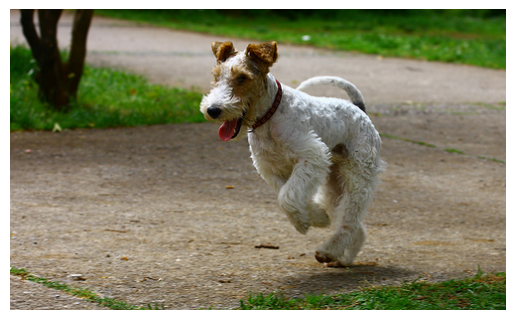

-----------------------------------
Найденные изображения:


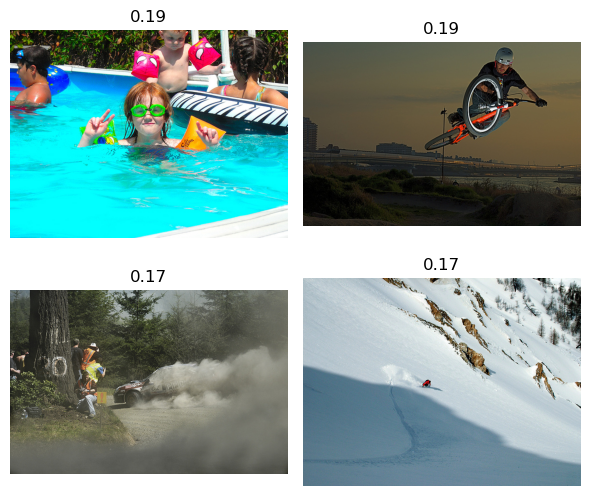

In [101]:
test_picture(query_test['query_text'][2])

Описание изображения: a group of people aree ice skating in a big city

Изображение которое должна найти модель:
-----------------------------------


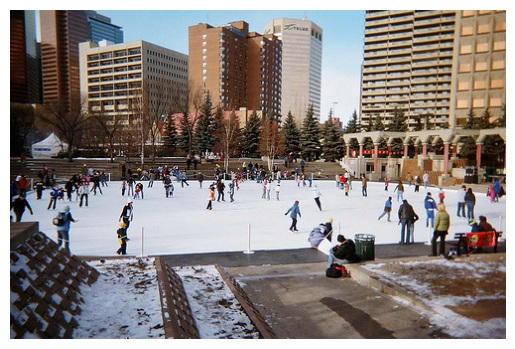

-----------------------------------
Найденные изображения:


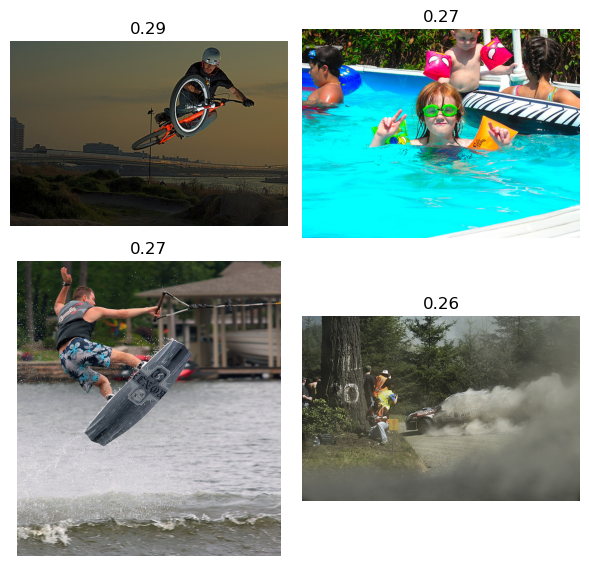

In [102]:
test_picture(query_test['query_text'][3])

In [103]:
test_picture(query_test['query_text'][4])

Описание изображения: little kid in blue coat and hat riding a tricycle 

This image is unavailable in your country in compliance with local laws.
-------------------------------------------------------------------------------------
Это изображение недоступно в вашей стране в соответствии с местным законодательством.


Описание изображения: two black dogs fighting over an orange toy

Изображение которое должна найти модель:
-----------------------------------


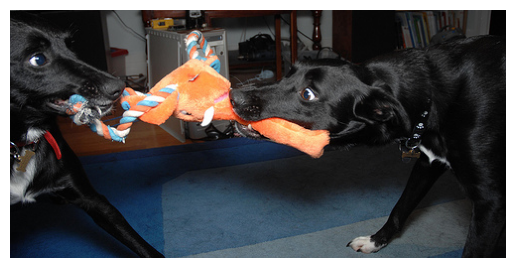

-----------------------------------
Найденные изображения:


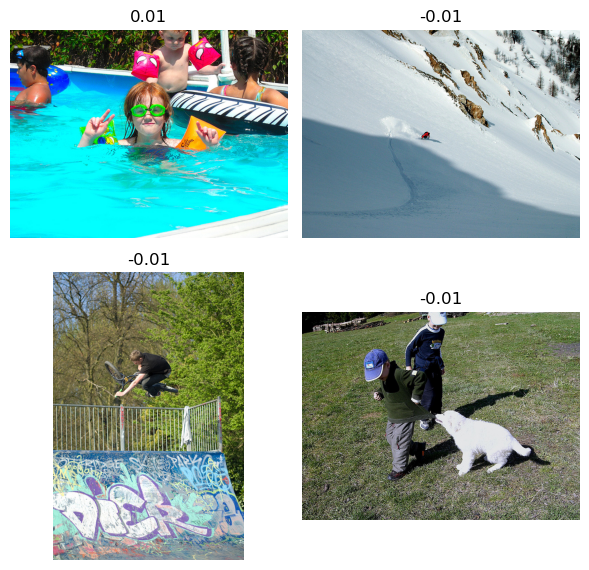

In [104]:
test_picture(query_test['query_text'][5])

Описание изображения: a dog jumping for a tennis ball neare an ocean

Изображение которое должна найти модель:
-----------------------------------


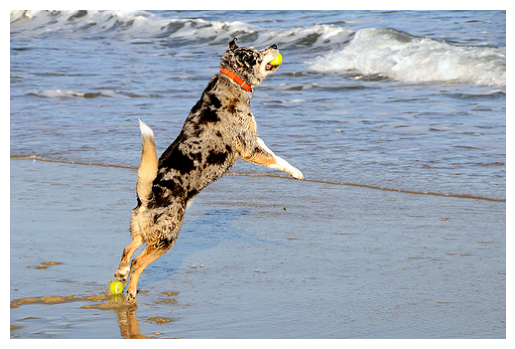

-----------------------------------
Найденные изображения:


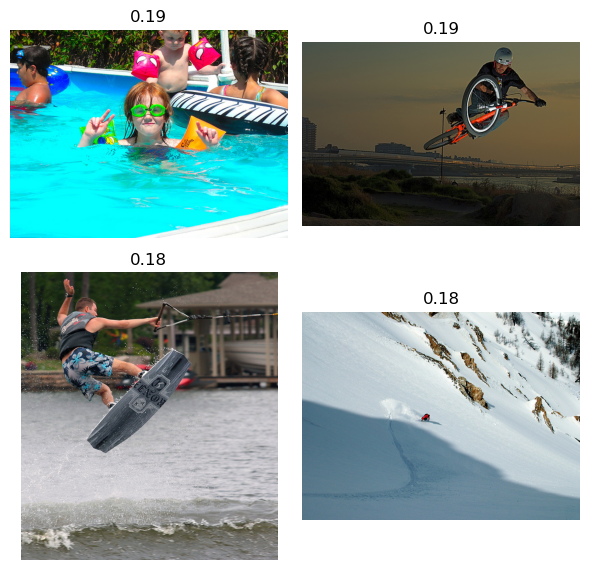

In [105]:
test_picture(query_test['query_text'][6])

In [106]:
test_picture(query_test['query_text'][7])

Описание изображения: boy flying a distant kite 

This image is unavailable in your country in compliance with local laws.
-------------------------------------------------------------------------------------
Это изображение недоступно в вашей стране в соответствии с местным законодательством.


In [107]:
test_picture(query_test['query_text'][8])

Описание изображения: kids play ultimate frisbee 

This image is unavailable in your country in compliance with local laws.
-------------------------------------------------------------------------------------
Это изображение недоступно в вашей стране в соответствии с местным законодательством.


In [108]:
test_picture(query_test['query_text'][9])

Описание изображения: a girl in a purple shirt feeding ducks 

This image is unavailable in your country in compliance with local laws.
-------------------------------------------------------------------------------------
Это изображение недоступно в вашей стране в соответствии с местным законодательством.


По условию на вход модели должен подаваться конкатенированный вектор из вектора изображений и вектора текста и на выходе должна быть спрогнозированная оценка эксперта.

В функции поиска изображения так и сделано.

Функция отсекает запрещенные описания, а вот поиск сосвем не работает. Модель не находит нужное фото.

P.S> Хотя странно ошибка не большая... Видимо я где-то ошибся, но не могу понять где..

## Вывод

Обученная модель не показывает результатов. Для такой задачи видимо лучше использовать уже предобученную модель.

Например `sentence-transformers/clip-ViT-B-32`, где одновременно из коробки можно получить вектора изображений и описаний и по косинусному расстоянию между векторами подбирать соответсвие. Соотвественно для такой модели и экспертная оценка может быть не нужна....

**Альтрнативный подход `SentenceTransformer('clip-ViT-B-32')`.**

Загрузка предобученной модели.

In [109]:
model_clip = SentenceTransformer('clip-ViT-B-32')

ftfy or spacy is not installed using BERT BasicTokenizer instead of ftfy.


Получение векторов для тестовых изображении.

In [110]:
img_emb = model_clip.encode([
    Image.open(os.path.join(PATH_TEST, data_images['image'][file]))
    for file in range(len(data_images))],
                            batch_size=10,
                            convert_to_tensor=True,
                            show_progress_bar=True)

Batches:   0%|          | 0/10 [00:00<?, ?it/s]

**Функция для тестирования модели.**

In [111]:
def test_picture_clip(text):
    '''

    Функция для тестирования модели.

    Параметры:

    text: текст с описанием

    '''

    if [i for i in clear_text_lemm(text).split() if i in stop_list]:

        print(f'Описание изображения: {text} \n')
        print(
            'This image is unavailable in your country in compliance with local laws.'
        )
        print(
            '-------------------------------------------------------------------------------------'
        )
        print(
            'Это изображение недоступно в вашей стране в соответствии с местным законодательством.'
        )

    else:

        text_emb = model_clip.encode(text, convert_to_tensor=True, show_progress_bar=True)
        score = util.semantic_search(text_emb, img_emb, top_k=4)[0]

        print(f"Описание изображения: {text}\n")
        print(f"Изображение которое должна найти модель:")
        print("-" * 35)

        image = Image.open(
            os.path.join(
                PATH_TEST, query_test.iloc[query_test[
                    query_test['query_text'] == text].index[0]]['image']))
        plt.imshow(image)
        plt.axis('off')
        plt.show()

        print("-" * 35)
        print(f"Найденные изображения:")

        fig = plt.figure(figsize=(6,6))

        for i in range(4):
            image = Image.open(os.path.join(PATH_TEST, data_images.iloc[score[i]['corpus_id']][0]))
            fig.add_subplot(2, 2, i+1)
            plt.imshow(image)
            plt.axis('off')
            plt.tight_layout()

**Применение функции.**

В функцию передам теже значения из датасета `query_test`.

In [112]:
test_picture_clip(query_test['query_text'][0])

Описание изображения: a group of girls who aree gothically dressed standing together 

This image is unavailable in your country in compliance with local laws.
-------------------------------------------------------------------------------------
Это изображение недоступно в вашей стране в соответствии с местным законодательством.


In [113]:
test_picture_clip(query_test['query_text'][1])

Описание изображения: a woman and girl riding downhill on a sled with a dog running alongside them 

This image is unavailable in your country in compliance with local laws.
-------------------------------------------------------------------------------------
Это изображение недоступно в вашей стране в соответствии с местным законодательством.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Описание изображения: the dog is running

Изображение которое должна найти модель:
-----------------------------------


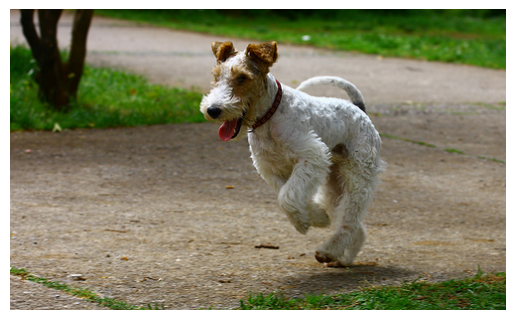

-----------------------------------
Найденные изображения:


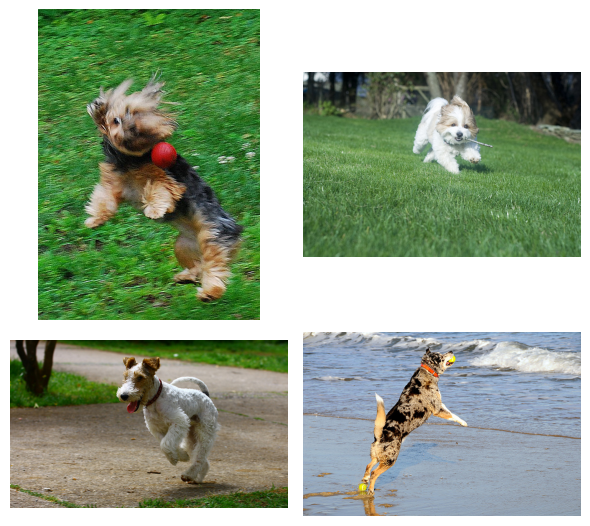

In [114]:
test_picture_clip(query_test['query_text'][2])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Описание изображения: a group of people aree ice skating in a big city

Изображение которое должна найти модель:
-----------------------------------


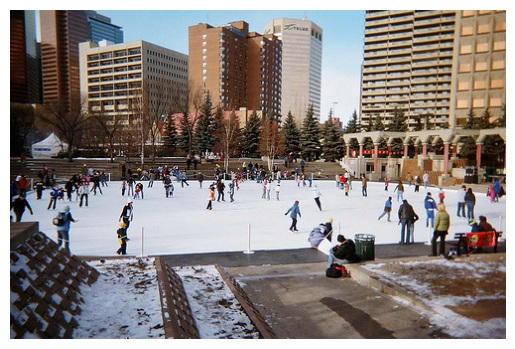

-----------------------------------
Найденные изображения:


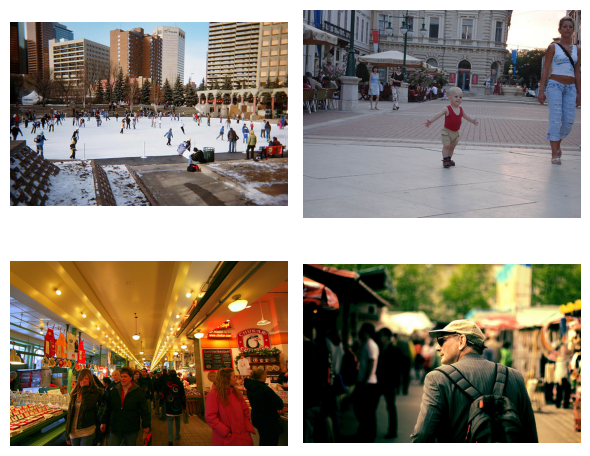

In [115]:
test_picture_clip(query_test['query_text'][3])

In [116]:
test_picture_clip(query_test['query_text'][4])

Описание изображения: little kid in blue coat and hat riding a tricycle 

This image is unavailable in your country in compliance with local laws.
-------------------------------------------------------------------------------------
Это изображение недоступно в вашей стране в соответствии с местным законодательством.


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Описание изображения: two black dogs fighting over an orange toy

Изображение которое должна найти модель:
-----------------------------------


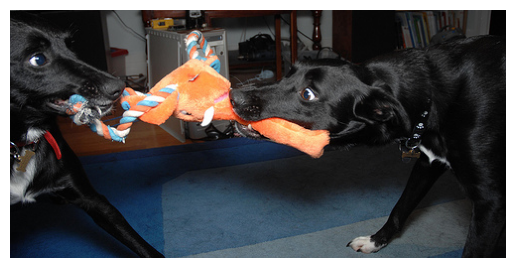

-----------------------------------
Найденные изображения:


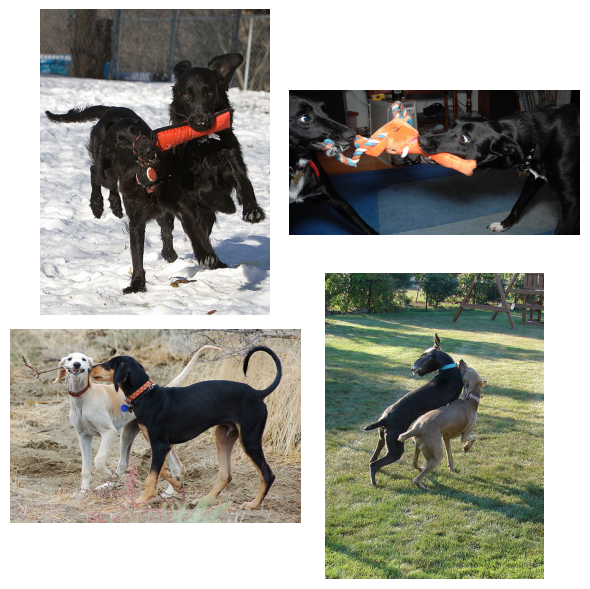

In [117]:
test_picture_clip(query_test['query_text'][5])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Описание изображения: a dog jumping for a tennis ball neare an ocean

Изображение которое должна найти модель:
-----------------------------------


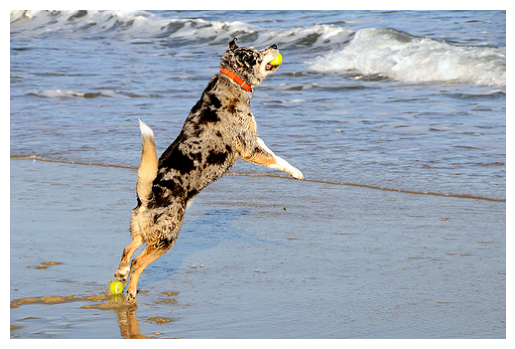

-----------------------------------
Найденные изображения:


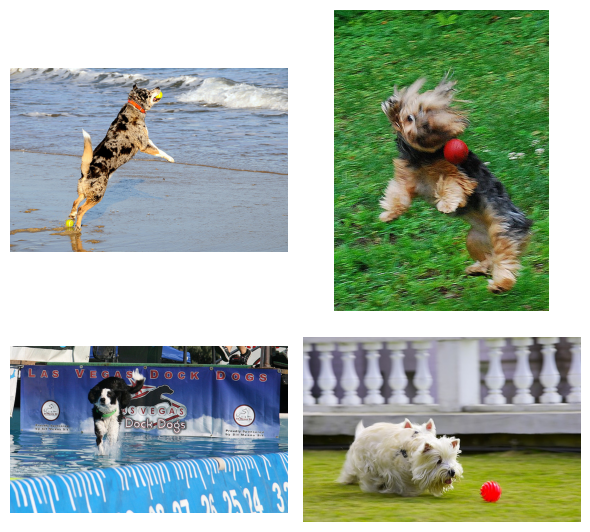

In [118]:
test_picture_clip(query_test['query_text'][6])

In [119]:
test_picture_clip(query_test['query_text'][7])

Описание изображения: boy flying a distant kite 

This image is unavailable in your country in compliance with local laws.
-------------------------------------------------------------------------------------
Это изображение недоступно в вашей стране в соответствии с местным законодательством.


In [120]:
test_picture_clip(query_test['query_text'][8])

Описание изображения: kids play ultimate frisbee 

This image is unavailable in your country in compliance with local laws.
-------------------------------------------------------------------------------------
Это изображение недоступно в вашей стране в соответствии с местным законодательством.


In [121]:
test_picture_clip(query_test['query_text'][9])

Описание изображения: a girl in a purple shirt feeding ducks 

This image is unavailable in your country in compliance with local laws.
-------------------------------------------------------------------------------------
Это изображение недоступно в вашей стране в соответствии с местным законодательством.
